# Coherence Analysis

Compared against:
- heading
- polarization
- incidence angle
- amplitude
- roughness
- canopy
- aspect
- snow depth change
- snow depth

In [1]:
import xarray as xa
import rioxarray as rxa
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from glob import glob
from os.path import join
import scipy
from scipy.stats import mannwhitneyu, linregress

## Functions Created

In [2]:
def amp2dB (amp):
    return 20 * np.log10(amp)

def datarray_to_numpy(x, y):
    if type(x)== xa.core.dataarray.DataArray:
        x_dirty = x.values.ravel()
        y = y.values.ravel()
    else:
        x_dirty = x
    x = x_dirty[(~np.isnan(x_dirty)) & (~np.isnan(y))]
    y = y[(~np.isnan(x_dirty)) & (~np.isnan(y))]
    return x, y

def mann_test(x, y, xlabel = 'x', ylabel = 'y'):
    x, y = datarray_to_numpy(x,y)
    stat, p = mannwhitneyu(x, y)   
    print(f'Comparison of {xlabel} vs {ylabel} center has a p value of {p:.10f} of not being from same distribution with {len(x)} observations.')
    if p < 0.1:
        print(f'Median of {xlabel}: {np.median(x)} compared to median of {ylabel}: {np.median(y)}')

def r2_value(x, y):
    x, y = datarray_to_numpy(x,y)
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
    print(f'slope: {slope}. intercept: {intercept}. r_value {r_value}. p value: {p_value}')

In [3]:
ds = xa.open_dataset('/Users/zachkeskinen/Documents/uavsar/data/dc_lidar/ds-lidar-us5.nc')
ds = ds.drop('spatial_ref')
df = ds.to_dataframe()
df = df.reset_index(level=[0,1])

## Overviews

In [4]:
df.describe()

,y,x,sd_diff,canopy,sd1,sd2,bare_earth,hillshade,slope,aspect,...,052_inc,232_inc,052_unw_VV_sd,052_unw_VH_sd,052_unw_HV_sd,052_unw_HH_sd,232_unw_VV_sd,232_unw_VH_sd,232_unw_HV_sd,232_unw_HH_sd
count,2.843568e+06,2.843568e+06,429845.000000,475622.000000,6.905620e+05,5.929010e+05,1.370338e+06,1.369635e+06,1.369635e+06,1.369635e+06,...,2.843568e+06,2.786394e+06,2.414775e+06,2.376509e+06,2.433753e+06,2.393472e+06,2.257388e+06,2.186309e+06,2.159543e+06,2.187272e+06
mean,4.374633e+01,-1.161034e+02,-0.212259,4.704857,inf,inf,1.814861e+03,1.651730e+02,2.473777e+01,1.892251e+02,...,1.016028e+00,1.059745e+00,-2.138434e-01,-2.149903e-01,-2.144584e-01,-2.146996e-01,-2.380735e-01,-2.397954e-01,-2.399998e-01,-2.398356e-01
std,3.002462e-02,2.436292e-02,0.743819,6.523220,inf,inf,1.724355e+02,5.518217e+01,8.465457e+00,9.884921e+01,...,2.728924e-01,2.646599e-01,7.582135e-02,7.352895e-02,7.405241e-02,7.794963e-02,6.931589e-02,6.974558e-02,6.996109e-02,7.049089e-02
min,4.369436e+01,-1.161456e+02,-25.793945,-65.160645,-1.093384e+01,-2.477588e+01,1.368355e+03,1.000000e+00,6.994114e-03,0.000000e+00,...,1.870906e-01,2.349250e-01,-8.909025e-01,-9.105672e-01,-9.072236e-01,-9.105949e-01,-7.233915e-01,-7.194974e-01,-6.588151e-01,-8.907531e-01
25%,4.372034e+01,-1.161245e+02,-0.477539,1.125732,9.224854e-01,6.983643e-01,1.689500e+03,1.220000e+02,1.967930e+01,1.063232e+02,...,7.896783e-01,8.477611e-01,-2.667613e-01,-2.670122e-01,-2.665711e-01,-2.663395e-01,-2.861916e-01,-2.892575e-01,-2.898408e-01,-2.896908e-01
50%,4.374633e+01,-1.161034e+02,-0.187500,1.680542,1.327148e+00,1.072266e+00,1.817190e+03,1.700000e+02,2.528383e+01,1.981495e+02,...,1.018352e+00,1.074159e+00,-2.083559e-01,-2.104997e-01,-2.097645e-01,-2.087396e-01,-2.396215e-01,-2.411115e-01,-2.417167e-01,-2.419968e-01
75%,4.377232e+01,-1.160823e+02,0.051758,4.892914,1.841431e+00,1.489746e+00,1.941525e+03,2.130000e+02,3.029119e+01,2.716611e+02,...,1.236667e+00,1.279524e+00,-1.556607e-01,-1.583425e-01,-1.574087e-01,-1.558979e-01,-1.871655e-01,-1.884340e-01,-1.887271e-01,-1.881150e-01
max,4.379831e+01,-1.160613e+02,22.795898,83.403442,3.402823e+38,3.402823e+38,2.296592e+03,2.550000e+02,8.279096e+01,3.599914e+02,...,1.799048e+00,1.751787e+00,3.724266e-01,2.700576e-01,2.789078e-01,2.541577e-01,1.684246e-01,1.714170e-01,7.850134e-02,1.932101e-01


In [5]:
cs = [c for c in df.columns if ('052' not in c)]
cs = [c for c in cs if ('232' not in c)]

In [6]:
corr = df[[c for c in df.columns if ('052' not in c) or ('232' not in c)]].corr()

In [7]:
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

/var/folders/0n/swn__wf94qd3zdch1tvp087r0000gn/T/ipykernel_16408/1928666696.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm').set_precision(2)


,y,x,sd_diff,canopy,sd1,sd2,bare_earth,hillshade,slope,aspect,tpi,tri,roughness,052_cor_VV,052_cor_VH,052_cor_HV,052_cor_HH,052_unw_VV,052_unw_VH,052_unw_HV,052_unw_HH,232_cor_VV,232_cor_VH,232_cor_HV,232_cor_HH,232_unw_VV,232_unw_VH,232_unw_HV,232_unw_HH,052_amp1_VV,052_amp1_VH,052_amp1_HV,052_amp1_HH,052_amp2_VV,052_amp2_VH,052_amp2_HV,052_amp2_HH,232_amp1_VV,232_amp1_VH,232_amp1_HV,232_amp1_HH,232_amp2_VV,232_amp2_VH,232_amp2_HV,232_amp2_HH,052_inc,232_inc,052_unw_VV_sd,052_unw_VH_sd,052_unw_HV_sd,052_unw_HH_sd,232_unw_VV_sd,232_unw_VH_sd,232_unw_HV_sd,232_unw_HH_sd
y,1.00,0.00,-0.05,-0.14,-0.06,-0.01,0.61,0.03,-0.05,-0.02,0.00,-0.03,-0.04,0.05,0.01,0.05,0.03,0.03,-0.03,-0.00,-0.00,0.14,0.15,0.14,0.14,-0.07,-0.06,-0.07,-0.02,-0.14,-0.11,-0.09,-0.17,-0.15,-0.11,-0.10,-0.18,0.18,0.24,0.19,0.24,0.18,0.21,0.19,0.21,0.33,-0.21,0.22,0.19,0.21,0.20,-0.18,-0.18,-0.18,-0.15
x,0.00,1.00,-0.12,-0.03,-0.01,0.01,0.46,-0.10,0.03,-0.16,-0.00,0.02,0.02,0.00,0.03,0.02,0.01,-0.13,-0.13,-0.14,-0.10,-0.02,-0.02,-0.01,-0.01,0.08,0.03,0.03,0.07,0.21,0.27,0.25,0.27,0.18,0.23,0.23,0.23,-0.16,-0.18,-0.15,-0.18,-0.19,-0.21,-0.19,-0.20,-0.26,0.27,-0.32,-0.32,-0.31,-0.28,0.33,0.30,0.32,0.33
sd_diff,-0.05,-0.12,1.00,0.03,-0.34,0.71,-0.07,0.24,0.02,0.32,0.01,0.02,0.02,0.03,0.02,0.02,0.02,0.00,0.00,-0.00,0.00,0.05,0.05,0.05,0.05,-0.02,-0.03,-0.04,-0.04,-0.12,-0.11,-0.11,-0.12,-0.12,-0.11,-0.12,-0.12,0.14,0.14,0.14,0.14,0.14,0.14,0.13,0.14,0.18,-0.18,0.12,0.13,0.13,0.12,-0.17,-0.16,-0.17,-0.17
canopy,-0.14,-0.03,0.03,1.00,-0.21,-0.13,-0.17,0.04,0.07,0.01,0.00,0.06,0.06,0.08,0.08,0.07,0.09,-0.05,-0.03,-0.03,-0.01,0.10,0.11,0.11,0.14,-0.06,-0.08,-0.08,-0.06,0.23,0.21,0.21,0.25,0.20,0.19,0.19,0.23,0.39,0.33,0.34,0.39,0.37,0.32,0.32,0.38,0.03,-0.07,-0.01,0.01,0.00,0.02,-0.09,-0.08,-0.09,-0.06
sd1,-0.06,-0.01,-0.34,-0.21,1.00,1.00,0.47,-0.14,0.03,-0.35,-0.10,0.02,0.01,0.03,0.05,0.05,0.05,0.08,0.11,0.11,0.10,0.02,0.04,0.04,0.03,-0.13,-0.10,-0.11,-0.12,0.08,0.08,0.07,0.05,0.09,0.08,0.08,0.06,0.12,0.12,0.12,0.11,0.13,0.14,0.14,0.12,-0.02,-0.07,0.03,0.06,0.05,0.04,-0.12,-0.10,-0.11,-0.12
sd2,-0.01,0.01,0.71,-0.13,1.00,1.00,0.27,0.05,0.04,-0.01,-0.07,0.03,0.03,0.03,0.04,0.05,0.04,0.08,0.11,0.11,0.10,0.03,0.03,0.03,0.03,-0.12,-0.10,-0.10,-0.12,0.05,0.05,0.04,0.02,0.06,0.05,0.05,0.03,0.10,0.10,0.10,0.10,0.11,0.12,0.12,0.11,0.01,-0.09,0.05,0.07,0.07,0.06,-0.14,-0.12,-0.13,-0.14
bare_earth,0.61,0.46,-0.07,-0.17,0.47,0.27,1.00,0.02,-0.18,-0.07,0.01,-0.16,-0.17,-0.07,-0.15,-0.13,-0.11,-0.14,-0.20,-0.18,-0.16,0.01,-0.07,-0.07,-0.02,-0.07,-0.08,-0.07,-0.07,-0.21,-0.24,-0.24,-0.20,-0.25,-0.27,-0.27,-0.23,-0.16,-0.18,-0.20,-0.11,-0.17,-0.21,-0.22,-0.13,0.12,-0.03,-0.04,-0.08,-0.06,-0.05,-0.08,-0.10,-0.08,-0.07
hillshade,0.03,-0.10,0.24,0.04,-0.14,0.05,0.02,1.00,-0.10,0.58,-0.00,-0.10,-0.09,0.04,0.02,0.04,0.04,0.11,0.09,0.09,0.11,0.35,0.30,0.29,0.33,0.11,0.06,0.06,0.05,-0.55,-0.50,-0.50,-0.53,-0.57,-0.51,-0.51,-0.55,0.51,0.49,0.50,0.52,0.52,0.49,0.49,0.53,0.78,-0.80,0.63,0.63,0.63,0.62,-0.64,-0.63,-0.64,-0.64
slope,-0.05,0.03,0.02,0.07,0.03,0.04,-0.18,-0.10,1.00,0.04,0.00,0.97,0.95,-0.03,0.01,0.01,0.01,0.03,0.06,0.05,0.07,0.01,0.05,0.05,0.04,0.01,0.02,0.01,0.02,0.04,0.03,0.03,0.01,0.04,0.03,0.03,0.01,0.11,0.11,0.12,0.09,0.11,0.12,0.12,0.09,0.08,-0.06,0.09,0.10,0.11,0.11,-0.08,-0.08,-0.08,-0.07
aspect,-0.02,-0.16,0.32,0.01,-0.35,-0.01,-0.07,0.58,0.04,1.00,0.00,0.03,0.04,-0.03,-0.03,-0.02,-0.02,0.01,-0.01,-0.01,0.00,0.19,0.16,0.16,0.19,0.01,-0.02,-0.02,-0.03,-0.27,-0.26,-0.27,-0.27,-0.27,-0.27,-0.28,-0.28,0.31,0.28,0.29,0.31,0.31,0.27,0.27,0.31,0.44,-0.46,0.32,0.31,0.31,0.31,-0.39,-0.39,-0.39,-0.40


#### Subset Region

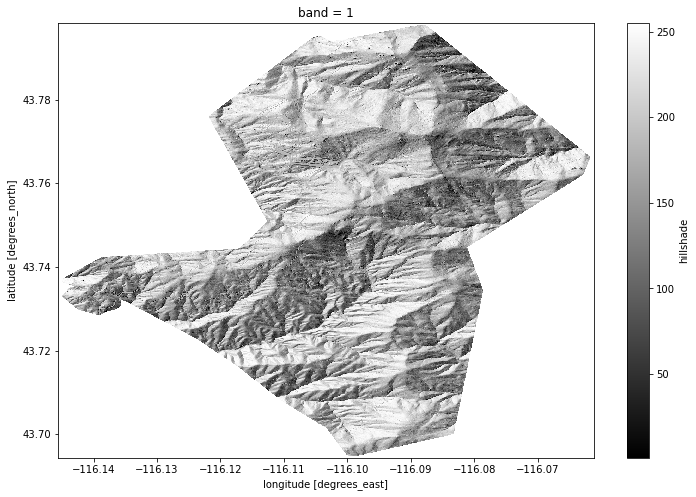

In [8]:
f, ax= plt.subplots(figsize = (12,8))
ds['hillshade'].plot(ax = ax, cmap = 'gray')
# ax.set_xlim([-116.117, -116.07])
# ax.set_ylim([43.765, 43.78])

## Heading! All VV for now.

In [9]:
pol = 'VV'

### Flight Time Difference

In [10]:
desc_052 = pd.read_csv('/Users/zachkeskinen/Documents/uavsar/data/dc_lidar/uavsar/lowman_05208_21015-009_21017-019_0007d_s01_L090_01_int_grd/lowman_05208_21015-009_21017-019_0007d_s01_L090_01_int_grd.csv', index_col = 0)
desc_232 = pd.read_csv('/Users/zachkeskinen/Documents/uavsar/data/dc_lidar/uavsar/lowman_23205_21015-008_21017-018_0007d_s01_L090_01_int_grd/lowman_23205_21015-008_21017-018_0007d_s01_L090_01_int_grd.csv', index_col = 0)
f052 = desc_052.loc['value','start time of acquisition for pass 1']
f232 = desc_232.loc['value','start time of acquisition for pass 1']
s052 = desc_052.loc['value','start time of acquisition for pass 2']
s232 = desc_232.loc['value','start time of acquisition for pass 2']
print(f'Heading 052 first flight time {f052} and for 232: {f232}')
print(f'Heading 052 second flight time {s052} and for 232: {s232}')

Heading 052 first flight time 3-Mar-2021 18:28:51 UTC and for 232: 3-Mar-2021 18:08:07 UTC
Heading 052 second flight time 10-Mar-2021 18:03:24 UTC and for 232: 10-Mar-2021 17:42:43 UTC


### Incidence Angle and Amplitude

#### Histograms

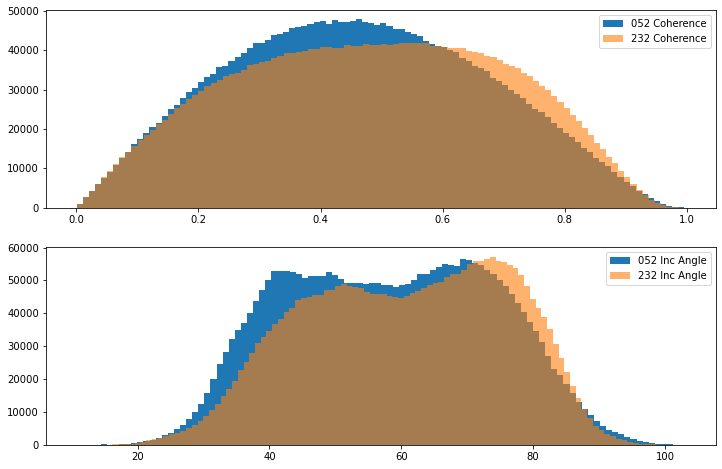

In [11]:
f, axes = plt.subplots(2, 1, figsize = (12, 8))
axes[0].hist(ds[f'052_cor_{pol}'].values.ravel(), bins = 100, label = '052 Coherence')
axes[0].hist(ds[f'232_cor_{pol}'].values.ravel(), bins = 100, alpha = 0.6, label = '232 Coherence')

axes[1].hist(np.rad2deg(ds[f'052_inc']).values.ravel(), bins = 100, label = '052 Inc Angle')
axes[1].hist(np.rad2deg(ds[f'232_inc']).values.ravel(), bins = 100, alpha = 0.6, label = '232 Inc Angle')
for ax in axes:
    ax.legend()
plt.show()

#### Statistics

In [12]:
mann_test(ds[f'052_cor_{pol}'], ds[f'232_cor_{pol}'], xlabel = '052 Coherence', ylabel = '232 Coherence')
mann_test(ds['052_inc'], ds['232_inc'], xlabel = '052 Inc Angle', ylabel = '232 Inc Angle')

r2_value(ds['052_inc'], ds[f'052_cor_{pol}'])
r2_value(ds['232_inc'], ds[f'232_cor_{pol}'])

Comparison of 052 Coherence vs 232 Coherence center has a p value of 0.0000000000 of not being from same distribution with 2786460 observations.
Median of 052 Coherence: 0.4566287696361542 compared to median of 232 Coherence: 0.48501965403556824
Comparison of 052 Inc Angle vs 232 Inc Angle center has a p value of 0.0000000000 of not being from same distribution with 2786394 observations.
Median of 052 Inc Angle: 1.0253357887268066 compared to median of 232 Inc Angle: 1.0741593837738037
slope: 0.06064506797637371. intercept: 0.39975667302231177. r_value 0.08038958011661956. p value: 0.0
slope: -0.2876228580616082. intercept: 0.7864009420426867. r_value -0.3542765102401879. p value: 0.0


#### 2d Histograms/hexbins

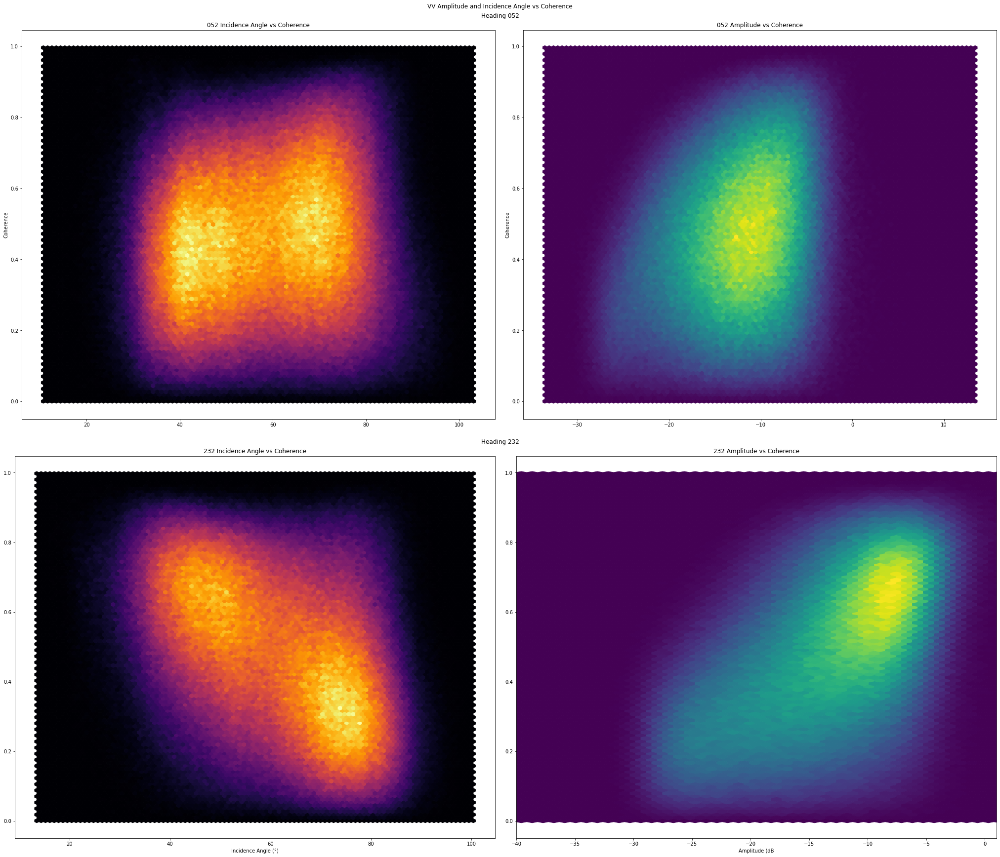

In [13]:
fig = plt.figure(constrained_layout=True, figsize=(28,24))
fig.suptitle(f'{pol} Amplitude and Incidence Angle vs Coherence')
# fig.suptitle('Figure title')
# create 3x1 subfigs
subfigs = fig.subfigures(nrows=2, ncols=1)

for row, subfig in enumerate(subfigs):
    if row == 0:
        subfig.suptitle(f'Heading 052')
    else:
        subfig.suptitle(f'Heading 232')



    # create 1x3 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=2)
    for col, ax in enumerate(axs):
        if row == 0 and col == 0:
            ax.hexbin(np.rad2deg(df['052_inc']), df[f'052_cor_{pol}'], cmap = 'inferno')
            ax.set_title('052 Incidence Angle vs Coherence')
            ax.set_ylabel('Coherence')
        elif row == 0 and col == 1:
            ax.hexbin(amp2dB(df[f'052_amp1_{pol}']), df[f'052_cor_{pol}'], cmap = 'viridis')
            ax.set_title('052 Amplitude vs Coherence')
            ax.set_ylabel('Coherence')
        elif row == 1 and col == 0:
            ax.hexbin(np.rad2deg(df[f'232_inc']), df[f'232_cor_{pol}'], cmap = 'inferno')
            ax.set_title('232 Incidence Angle vs Coherence')
            ax.set_xlabel('Incidence Angle (°)')
        else:
            ax.hexbin(amp2dB(df[f'232_amp1_{pol}']), df[f'232_cor_{pol}'], cmap = 'viridis')
            ax.set_title('232 Amplitude vs Coherence')
            ax.set_xlim(-40, 1)
            ax.set_xlabel('Amplitude (dB')

#### Subset Image

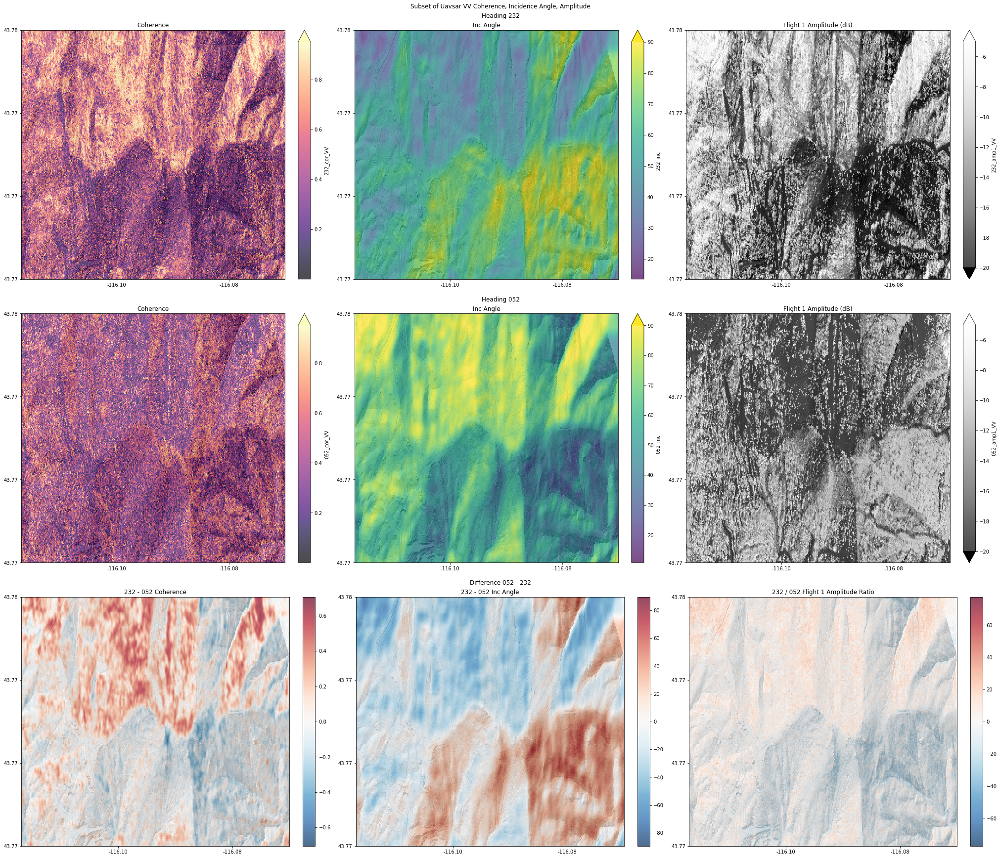

In [14]:
from matplotlib.ticker import MaxNLocator
from matplotlib.ticker import FormatStrFormatter

dirs = {1 : '052', 0: '232'}
fig = plt.figure(constrained_layout=True, figsize=(28,24))

fig.suptitle(f'Subset of Uavsar {pol} Coherence, Incidence Angle, Amplitude')
# create 3x1 subfigs
subfigs = fig.subfigures(nrows=3, ncols=1)

for row, subfig in enumerate(subfigs):
    if row == 0 or row == 1:
        dir = dirs[row]
        subfig.suptitle(f'Heading {dir}')
    else:
        subfig.suptitle('Difference 052 - 232')



    # create 1x3 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=3)
    for col, ax in enumerate(axs):
        ds['hillshade'].plot(ax = ax, zorder = 1, cmap = 'gray', add_colorbar= False)
        if row <2:
            if col == 0:
                ds[f'{dir}_cor_{pol}'].plot(ax = ax, alpha = 0.7, cmap = 'magma', vmax = 0.95)
                ax.set_title('Coherence')
            elif col == 1:
                np.rad2deg(ds[f'{dir}_inc']).plot(ax = ax, alpha = 0.7, vmax = 90, cmap = 'viridis')
                ax.set_title('Inc Angle')
            elif col == 2:
                amp2dB(ds[f'{dir}_amp1_{pol}']).plot(vmax = -5, vmin = -20, cmap = 'Greys_r', ax = ax, alpha = 0.7)
                ax.set_title('Flight 1 Amplitude (dB)')
        else:
            if col == 0:
                cor_dif_smo = scipy.ndimage.gaussian_filter(ds[f'232_cor_{pol}']- ds[f'052_cor_{pol}'], 2)
                cor_dif_smo = xa.DataArray(cor_dif_smo, coords = ds['052_cor_VV'].coords)
                cor_dif_smo.plot(ax = ax, alpha = 0.7, cmap = 'RdBu_r')
                ax.set_title('232 - 052 Coherence')
            elif col == 1:
                (np.rad2deg(ds['232_inc']) - np.rad2deg(ds['052_inc'])).plot(ax = ax, alpha = 0.7)
                ax.set_title('232 - 052 Inc Angle')
            elif col == 2:
                amp2dB(ds[f'232_amp1_{pol}'] / ds[f'052_amp1_{pol}']).plot( ax = ax, alpha = 0.7)
                ax.set_title('232 / 052 Flight 1 Amplitude Ratio')
        # ax.set_xlabel('Longitude')
        # ax.set_ylabel('Latitude')
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xlim([-116.117, -116.07])
        ax.set_ylim([43.765, 43.78])
        ax.xaxis.get_major_locator().set_params(nbins = 3, integer=True)
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        ax.yaxis.get_major_locator().set_params(nbins = 4, integer=True)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# plt.tight_layout()

In [19]:
inc = np.append(ds['232_inc'].values.ravel(), ds['052_inc'].values.ravel())
cor_vv = np.append(ds[f'232_cor_{pol}'].values.ravel(), ds[f'232_cor_{pol}'].values.ravel())

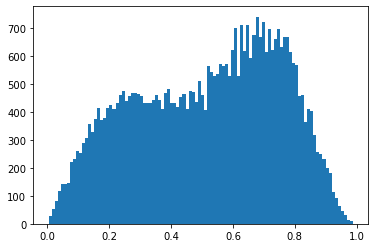

In [22]:
plt.hist(cor_vv[np.rad2deg(inc) > 90], bins = 100)
plt.show()

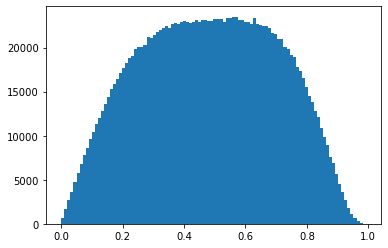

In [25]:
plt.hist(cor_vv[(np.rad2deg(inc) < 50) & (np.rad2deg(inc) >30 )], bins = 100)
plt.show()

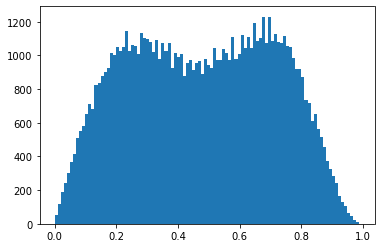

In [27]:
plt.hist(cor_vv[(np.rad2deg(inc) < 30)], bins = 100)
plt.show()

## Amplitude Change! All VV for now.

In [15]:
pol = 'VV'

In [16]:
diff_232 = ds[f'232_amp2_{pol}'] - ds[f'232_amp1_{pol}']
diff_052 = ds[f'052_amp2_{pol}'] - ds[f'052_amp1_{pol}']

#### Histogram

In [17]:
f, axes = plt.subplots(1, 1, figsize = (12, 8))
axes.hist(diff_052.values.ravel(), bins = 500, alpha = 0.6, label = '052 Amplitude Difference')
axes.hist(diff_232.values.ravel(), bins = 500, label = '232 Amplitude Difference')

plt.xlim(-0.5, 0.5)
plt.legend()
plt.show()

KeyboardInterrupt: 

#### Statistics

In [ ]:
mann_test(diff_052, diff_232, xlabel = '052 Amplitude Difference', ylabel = '052 Amplitude Difference')
r2_value(diff_052, ds[f'052_cor_{pol}'])
r2_value(diff_232, ds[f'232_cor_{pol}'])

Comparison of 052 Amplitude Difference vs 052 Amplitude Difference center has a p value of 0.0000000000 of not being from same distribution with 2786460 observations.
Median of 052 Amplitude Difference: -0.038078658282756805 compared to median of 052 Amplitude Difference: -0.04035869985818863
slope: -0.35630710265121085. intercept: 0.44236979729017256. r_value -0.11979228422137699. p value: 0.0
slope: -0.7830104871365704. intercept: 0.4366286020784261. r_value -0.2473201931844036. p value: 0.0


#### 2d histograms

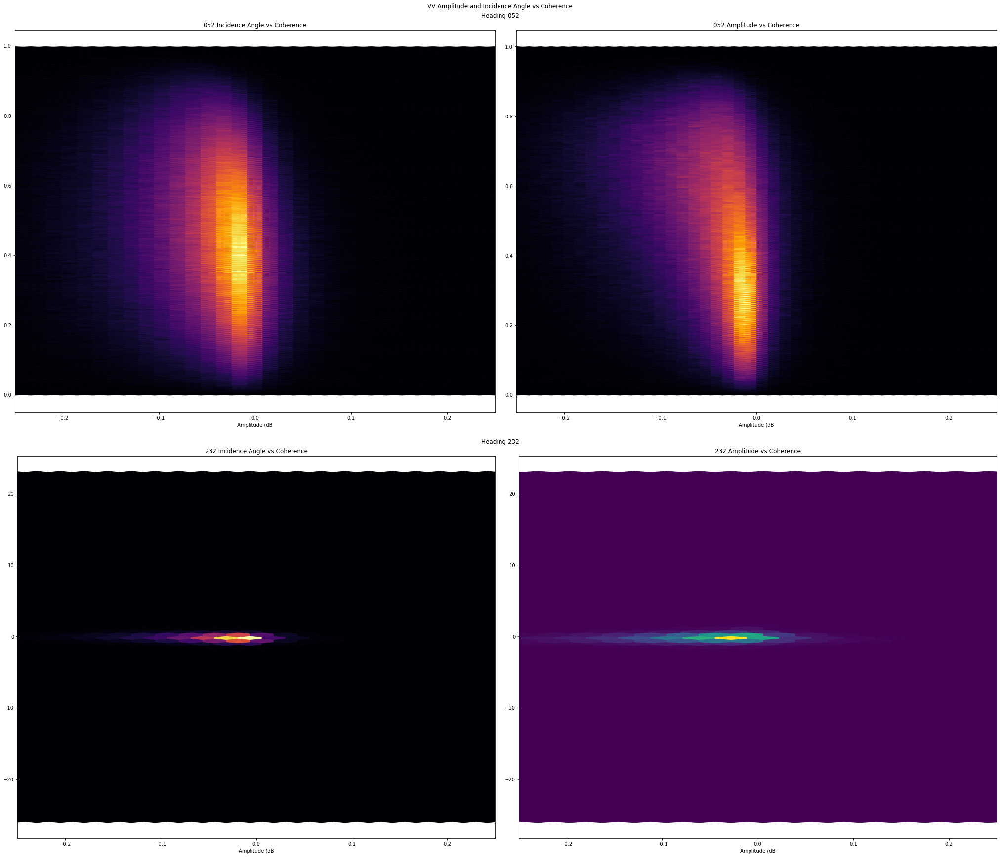

In [ ]:
fig = plt.figure(constrained_layout=True, figsize=(28,24))
fig.suptitle(f'{pol} Amplitude and Incidence Angle vs Coherence')
# fig.suptitle('Figure title')
# create 3x1 subfigs
subfigs = fig.subfigures(nrows=2, ncols=1)

for row, subfig in enumerate(subfigs):
    if row == 0:
        subfig.suptitle(f'Heading 052')
    else:
        subfig.suptitle(f'Heading 232')



    # create 1x3 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=2)
    for col, ax in enumerate(axs):
        if row == 0 and col == 0:
            ax.hexbin(diff_052.values.ravel(), df[f'052_cor_{pol}'], cmap = 'inferno', gridsize=300)
            ax.set_title('052 Incidence Angle vs Coherence')
            ax.set_xlabel('Amplitude (dB')
            ax.set_xlim(-0.25,0.25)
        elif row == 0 and col == 1:
            ax.hexbin(diff_232.values.ravel(), df[f'232_cor_{pol}'], cmap = 'inferno', gridsize=300)
            ax.set_title('052 Amplitude vs Coherence')
            ax.set_xlabel('Amplitude (dB')
            ax.set_xlim(-0.25,0.25)
        elif row == 1 and col == 0:
            ax.hexbin(diff_232.values.ravel(), df[f'sd_diff'], cmap = 'inferno')
            ax.set_title('232 Incidence Angle vs Coherence')
            ax.set_xlabel('Amplitude (dB')
            ax.set_xlim(-0.25,0.25)
        else:
            ax.hexbin(diff_052.values.ravel(), df[f'sd_diff'], cmap = 'viridis')
            ax.set_title('232 Amplitude vs Coherence')
            ax.set_xlabel('Amplitude (dB')
            ax.set_xlim(-0.25,0.25)

#### Subset images

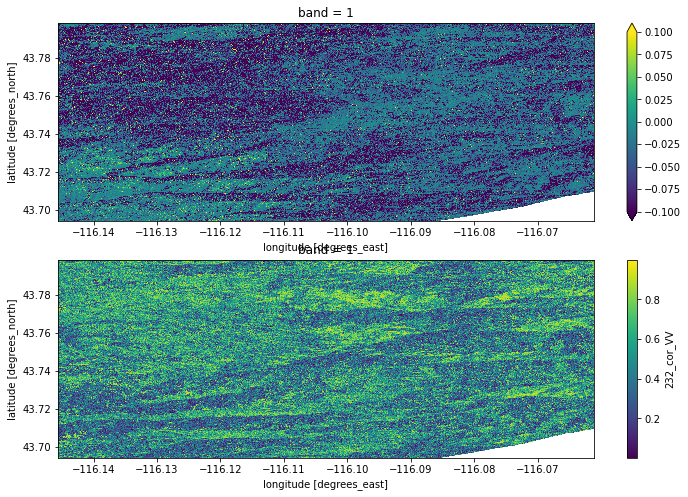

In [ ]:
f, axes = plt.subplots(2, figsize = (12,8))
(ds['232_amp2_VV'] - ds['232_amp1_VV']).plot(vmax = 0.1, vmin = -0.1, ax = axes[0])
ds['232_cor_VV'].plot(ax = axes[1])

## Canopy

all VV for now

In [ ]:
pol = 'VV'

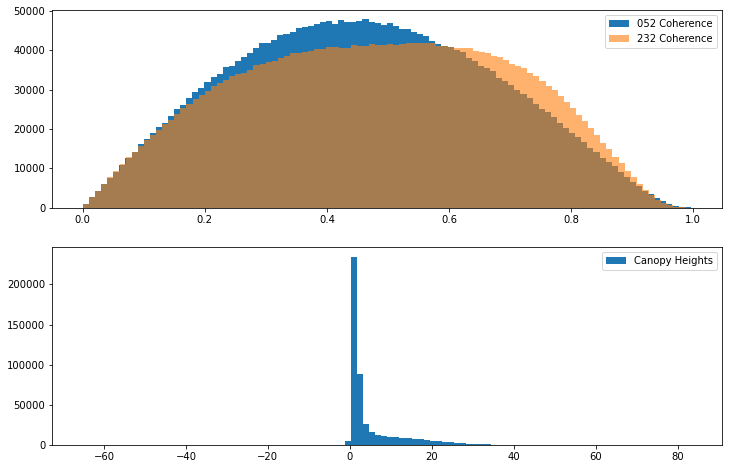

In [ ]:
f, axes = plt.subplots(2, 1, figsize = (12, 8))
axes[0].hist(ds[f'052_cor_{pol}'].values.ravel(), bins = 100, label = '052 Coherence')
axes[0].hist(ds[f'232_cor_{pol}'].values.ravel(), bins = 100, alpha = 0.6, label = '232 Coherence')

axes[1].hist(ds[f'canopy'].values.ravel(), bins = 100, label = 'Canopy Heights')
for ax in axes:
    ax.legend()
plt.show()

In [ ]:
r2_value(ds['canopy'], ds[f'052_cor_{pol}'])
r2_value(ds['canopy'], ds[f'232_cor_{pol}'])

slope: 0.002314197975221795. intercept: 0.435926011662461. r_value 0.07559656723573668. p value: 0.0
slope: 0.003438474983039078. intercept: 0.4431191760886569. r_value 0.10446034158772612. p value: 0.0


(0.0, 40.0)

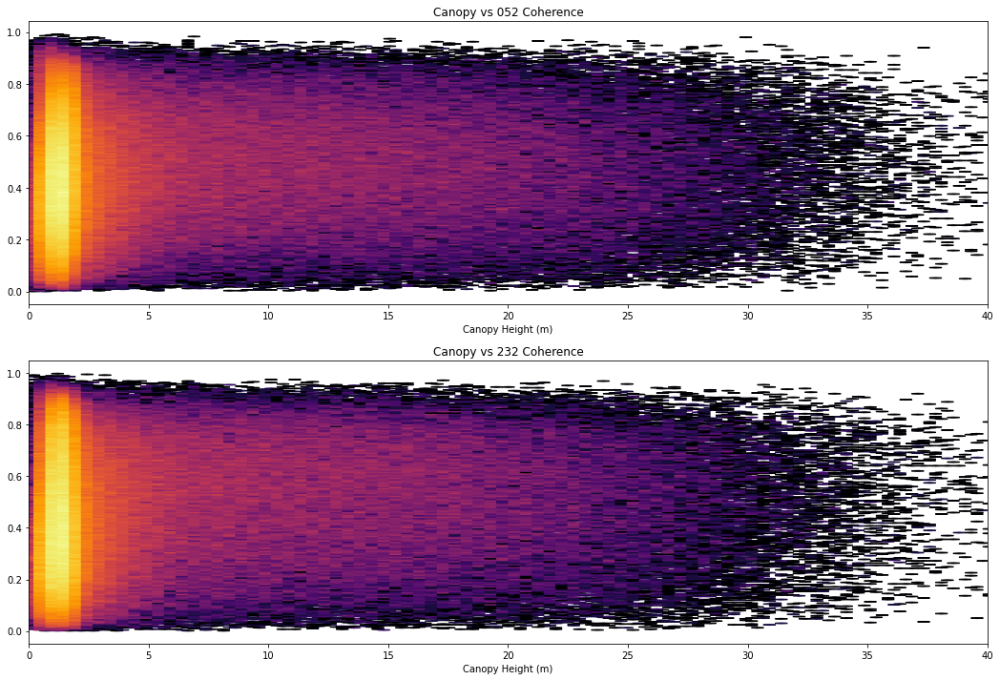

In [ ]:
fig, axes = plt.subplots(2, figsize=(18,12))

axes[0].hexbin(ds['canopy'].values.ravel(), df[f'052_cor_{pol}'], cmap = 'inferno', gridsize=300, bins = 'log')
axes[0].set_title('Canopy vs 052 Coherence')
axes[0].set_xlabel('Canopy Height (m)')
axes[0].set_xlim(0, 40)

axes[1].hexbin(ds['canopy'].values.ravel(), df[f'232_cor_{pol}'], cmap = 'inferno', gridsize=300, bins = 'log')
axes[1].set_title('Canopy vs 232 Coherence')
axes[1].set_xlabel('Canopy Height (m)')
axes[1].set_xlim(0, 40)

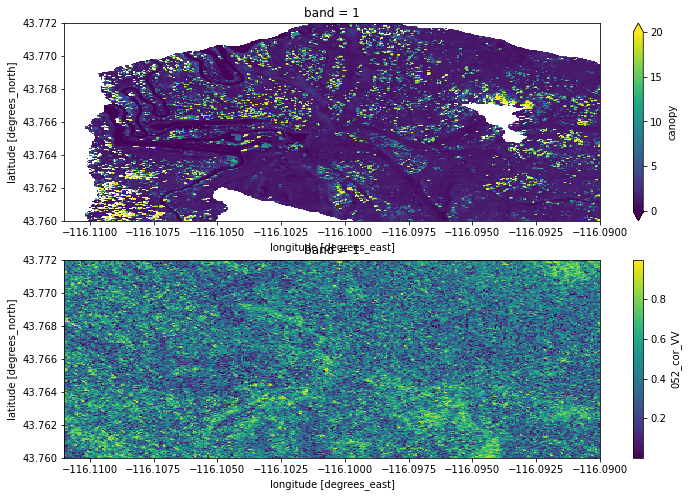

In [ ]:
f, axes = plt.subplots(2, figsize = (12,8))
ds['canopy'].plot(vmax = 0, vmin = 20, ax = axes[0])
ds['052_cor_VV'].plot(ax = axes[1])
for ax in axes:
    ax.set_xlim([-116.111, -116.09])
    ax.set_ylim([43.76, 43.772])

# Roughness

all VV for now

In [ ]:
pol = 'VV'

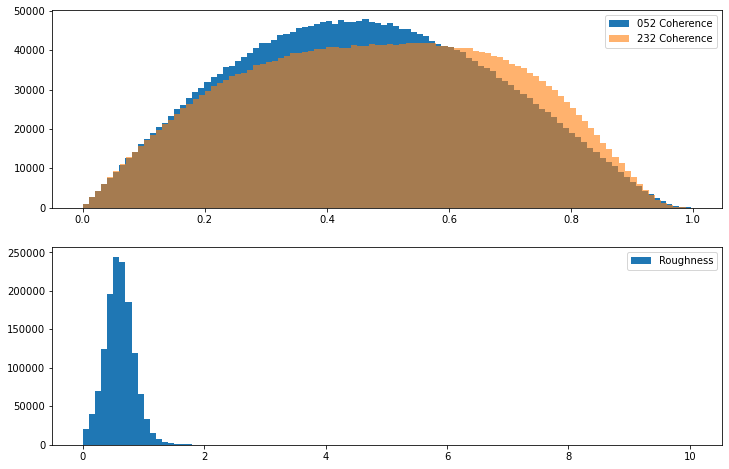

In [ ]:
f, axes = plt.subplots(2, 1, figsize = (12, 8))
axes[0].hist(ds[f'052_cor_{pol}'].values.ravel(), bins = 100, label = '052 Coherence')
axes[0].hist(ds[f'232_cor_{pol}'].values.ravel(), bins = 100, alpha = 0.6, label = '232 Coherence')

axes[1].hist(ds[f'roughness'].values.ravel(), bins = 100, label = 'Roughness')
for ax in axes:
    ax.legend()
plt.show()

In [ ]:
r2_value(ds['roughness'], ds[f'052_cor_{pol}'])
r2_value(ds['roughness'], ds[f'232_cor_{pol}'])

slope: -0.01890863254333194. intercept: 0.46121768108639466. r_value -0.023534714620190005. p value: 4.834113563965404e-167
slope: 0.012410821146184399. intercept: 0.4707549792597632. r_value 0.014269623942257519. p value: 1.2937014973541157e-62


Text(0.5, 0, 'roughness')

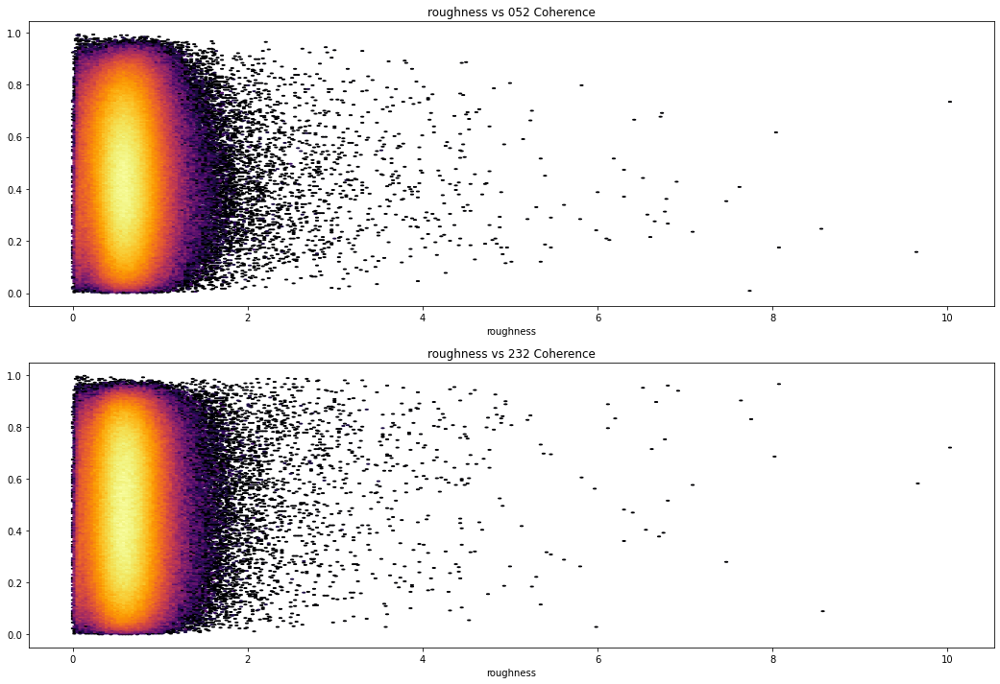

In [ ]:
fig, axes = plt.subplots(2, figsize=(18,12))

axes[0].hexbin(ds['roughness'].values.ravel(), df[f'052_cor_{pol}'], cmap = 'inferno', gridsize=300, bins = 'log')
axes[0].set_title('roughness vs 052 Coherence')
axes[0].set_xlabel('roughness')
# axes[0].set_xlim(0, 40)

axes[1].hexbin(ds['roughness'].values.ravel(), df[f'232_cor_{pol}'], cmap = 'inferno', gridsize=300, bins = 'log')
axes[1].set_title('roughness vs 232 Coherence')
axes[1].set_xlabel('roughness')
# axes[1].set_xlim(0, 40)

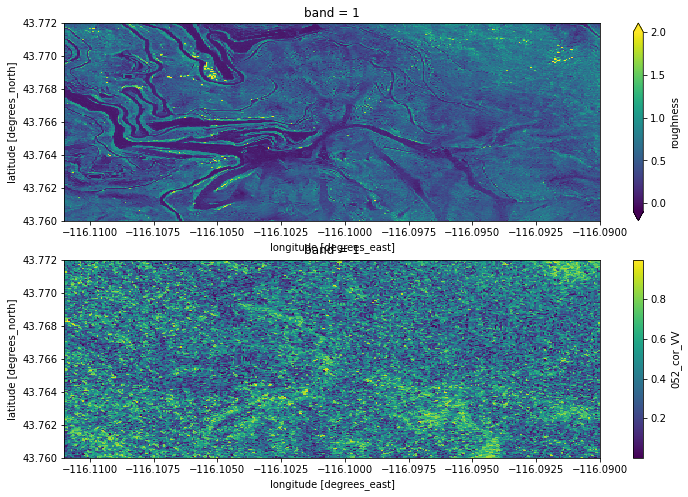

In [ ]:
f, axes = plt.subplots(2, figsize = (12,8))
ds['roughness'].plot(vmax = 0, vmin = 2, ax = axes[0])
ds['052_cor_VV'].plot(ax = axes[1])
for ax in axes:
    ax.set_xlim([-116.111, -116.09])
    ax.set_ylim([43.76, 43.772])

# Slope

VV for now

pol = 'VV

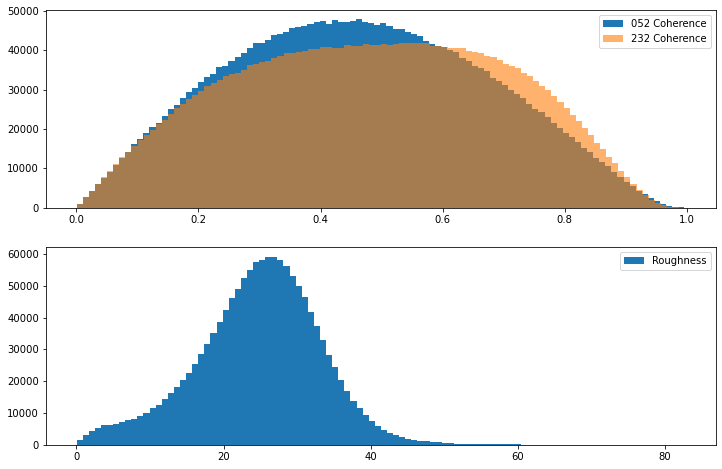

In [ ]:
f, axes = plt.subplots(2, 1, figsize = (12, 8))
axes[0].hist(ds[f'052_cor_{pol}'].values.ravel(), bins = 100, label = '052 Coherence')
axes[0].hist(ds[f'232_cor_{pol}'].values.ravel(), bins = 100, alpha = 0.6, label = '232 Coherence')

axes[1].hist(ds[f'slope'].values.ravel(), bins = 100, label = 'Roughness')
for ax in axes:
    ax.legend()
plt.show()

In [ ]:
r2_value(ds['slope'], ds[f'052_cor_{pol}'])
r2_value(ds['slope'], ds[f'232_cor_{pol}'])

slope: -0.0005944723478170392. intercept: 0.46445034839843063. r_value -0.02523617894386838. p value: 9.110625803990329e-192
slope: 0.0003554252031395486. intercept: 0.46949310315184467. r_value 0.013938092976723793. p value: 8.013837503461167e-60


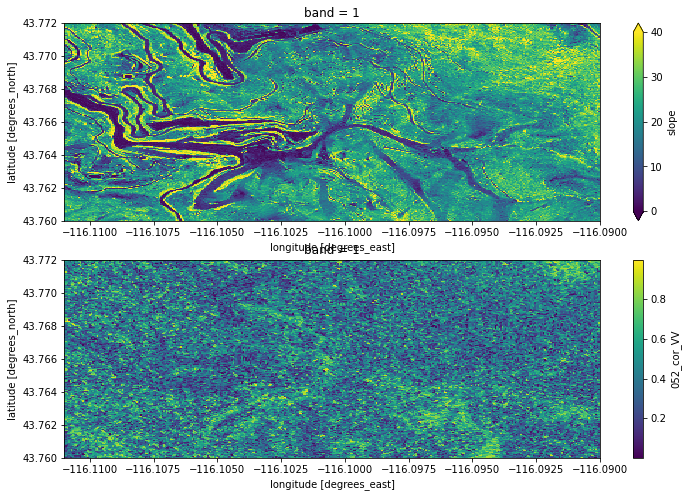

In [ ]:
f, axes = plt.subplots(2, figsize = (12,8))
ds['slope'].plot(vmax = 0, vmin = 40, ax = axes[0])
ds['052_cor_VV'].plot(ax = axes[1])
for ax in axes:
    ax.set_xlim([-116.111, -116.09])
    ax.set_ylim([43.76, 43.772])

# SD Diff

In [ ]:
def single_test(var):
    f, axes = plt.subplots(2, 1, figsize = (12, 8))
    axes[0].hist(ds[f'052_cor_{pol}'].values.ravel(), bins = 100, label = '052 Coherence')
    axes[0].hist(ds[f'232_cor_{pol}'].values.ravel(), bins = 100, alpha = 0.6, label = '232 Coherence')

    axes[1].hist(ds[var].values.ravel(), bins = 100, label = var)
    for ax in axes:
        ax.legend()
    plt.show()

    r2_value(ds[var], ds[f'052_cor_{pol}'])
    r2_value(ds[var], ds[f'232_cor_{pol}'])

    f, axes = plt.subplots(2, figsize = (12,8))
    ds[var].plot( ax = axes[0])
    ds['052_cor_VV'].plot(ax = axes[1])
    for ax in axes:
        ax.set_xlim([-116.111, -116.09])
        ax.set_ylim([43.76, 43.772])

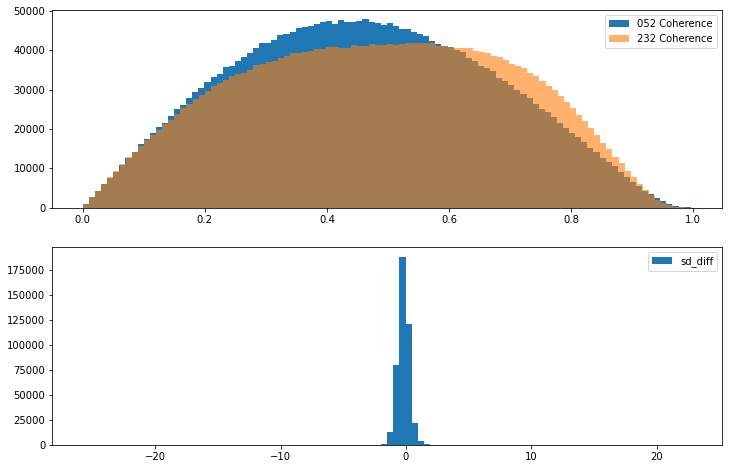

slope: 0.00746746994762401. intercept: 0.4473229750509581. r_value 0.027822052234285414. p value: 2.295357258204608e-74
slope: 0.014820878585092399. intercept: 0.4592845833644737. r_value 0.05139721707118723. p value: 2.991723436483013e-249


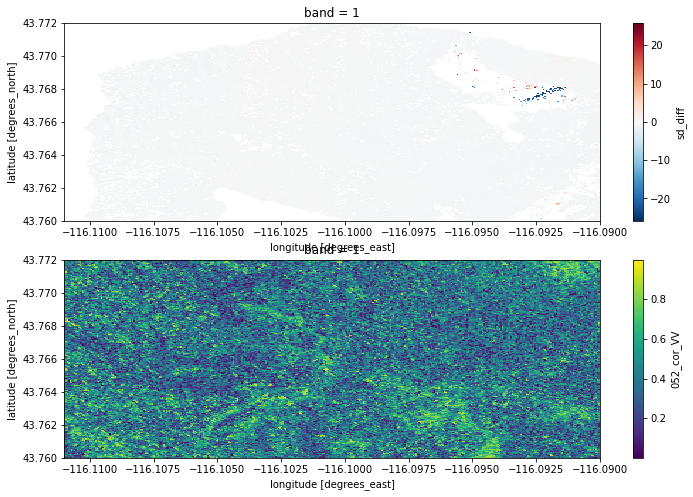

In [ ]:
single_test('sd_diff')

# Random Forest
https://towardsdatascience.com/random-forest-in-python-24d0893d51c0

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

In [ ]:
labels = ['sd_diff', 'sd1', 'bare_earth', '052_inc','canopy','aspect','roughness','tpi','052_amp1_VV', '052_cor_VV']
all = ds[labels].to_dataframe().dropna()
labels = ['sd_diff', 'sd1', 'bare_earth', '052_inc','canopy','aspect','roughness','tpi','052_amp1_VV']
x = all[labels].values
y = all['052_cor_VV'].values

train_x, test_x, train_y, test_y = train_test_split(x, y, test_size = 0.25, random_state = 42)

In [ ]:
baseline_errors = abs(np.mean(train_y) - test_y)
print('Average baseline error: ', round(np.mean(baseline_errors), 2))

Average baseline error:  0.17


In [ ]:
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(train_x[::10,:], train_y[::10]);

In [ ]:
# Use the forest's predict method on the test data
predictions = rf.predict(test_x)
# Calculate the absolute errors
errors = abs(predictions - test_y)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

Mean Absolute Error: 0.15 degrees.
